In [1]:
import numpy as np
import scipy as sc
import scipy.linalg as scl

#plots
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (30.0, 30.0)
#mpl.rc('text', usetex = True)
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
%matplotlib inline

# Fourier based registration

In this notebook, we will try to see the principle underlying the fourier based registration tools, and try to provide a simple implementation

## Convolution theorem: continuous version

It is well known that, given two continuous signals $s_1, s_2$ such that $s_i \in \mathbb{L}^2$ square integrable over $mathbb{R}$, we have the following property:

\begin{align*}
  F(s_1 \star s_2)(f) = F(s_1)(f)*F(s_2)(f)
\end{align*}

Here, we consider that the operator $F$ stands for the Fourier transform:
\begin{align*}
  F(s_i)(f) = \int_{\mathbb{R}} s_i(t) e^{-2\pi j ft} dt
\end{align*}
and $\star$ is the convolution operator, defined as:
\begin{align*}
  (s_1 \star s_2)(t) = \int_{\mathbb{R}} s_1(x) s_2(t-x) dx
\end{align*}

The proof is based on Fubini's theorem that allow us to exchange the integration order.

## Circular convolution for the discrete case

### Discrete Fourier transform as a linear operator
Let's now consider two discretized signals $x_1, x_2$ that are periodic of period of period N: $x_i[n+N]=x_i[n]$.

The discrete fourier transform reads:
\begin{align*}
  X[k]= \sum_{n=0}^{N-1} x[n]e^{-2 \pi j \frac{kn}{N}}
\end{align*}
And the inverse discrete fourier transform reads:
\begin{align*}
  x[n]= \frac{1}{N} \sum_{k=0}^{N-1} X[k]e^{2 \pi j \frac{kn}{N}}
\end{align*}

it is very interesting to see that each element of the direct space is the result of a dot product with Fourier space basis, and conversely, each element of the Fourier space is also the result of a dot product with a vector of the analysis Fourier basis.
This is much more clear if we write the discrete Fourier transform as a matrix F:
$X = F^{-1} x$ and $x = F X$ where we have:

\begin{align}
    F = \frac{1}{N} \begin{pmatrix}
    1 & 1 & \cdots & 1\\
    1 & e^{2\pi j\frac{1}{N}} & \cdots & e^{2\pi j\frac{N-1}{N}}\\
    \vdots & \vdots & \vdots & \vdots \\
    1 & e^{2\pi j\frac{N-1}{N}} & \cdots & e^{2\pi j\frac{(N-1)(N-1)}{N}}\\
    \end{pmatrix}
\end{align}
where k indices are different across a row, but stays the same along a column
and
 
\begin{align}
    F^{-1} = \begin{pmatrix}
    1 & 1 & \cdots & 1\\
    1 & e^{-2\pi j\frac{1}{N}} & \cdots & e^{-2\pi j\frac{N-1}{N}}\\
    \vdots & \vdots & \vdots & \vdots \\
    1 & e^{-2\pi j\frac{N-1}{N}} & \cdots & e^{-2\pi j\frac{(N-1)(N-1)}{N}}\\
    \end{pmatrix}
\end{align}
where n indices are diferrent across a row, but stays the same along a column

It is interesting to notice that $F$ is a unitary matrix.
From there, one can show that the $F, F^{-1}$ pair of matrices can be used to diagonalize any circulant matrices $C$. such that we can write $C = F D F^{-1}$

### Circular convolution as a linear operator
We also recall that discrete circular convolution reads:
\begin{align*}
  (s_1 \star s_2)[n] = \sum_{k=0}^{N-1} s_1[k] s_2[(n-k)\%N]
\end{align*}

It is interesting to notice that this convolution operator can be expressed as a linear operation, $(s_1 \star s_2) = S_2 s_1$ where we have:
\begin{align}
    S_2 = \begin{pmatrix}
    s_2[0] & s_2[N-1] & \cdots & s_2[1] \\
    s_2[1] & s_2[0] & \cdots & s_2[2] \\
    \vdots & \vdots & \vdots & \vdots \\
    s_2[N-1] & s_2[N-2] & \cdots & s_2[0] \\
    \end{pmatrix}
\end{align}
And one can easily see that this matrix is a circulant matrix

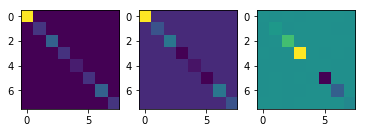

In [75]:
"""
  Check if fourier transform allows to diagonalize a circulant matrix
"""
N=8

#now generate the Fourier matrix
x = np.linspace(0, N-1, N) 
y = np.linspace(0, N-1, N)
xg, yg = np.meshgrid(x, y)
F=(1/N)*np.exp(2*np.pi*1j*xg*yg/N)
F_1=np.exp(-2*np.pi*1j*xg*yg/N)

#check that F and F_1 are inverse of each other
assert(np.allclose(np.dot(F,F_1)-np.identity(N),0))

#Lets check in practice that Fourier matrix can be used to diagonalize circulant matrices
circulant=scl.circulant(np.random.randint(0,100,N))

#Now show the diagonalized version of the circulant matrix:
diag = np.dot(F_1,np.dot(circulant,F))
fig,ax = plt.subplots(1,3)
ax[0].imshow(np.absolute(diag))
ax[1].imshow(np.real(diag))
ax[2].imshow(np.imag(diag))

## Convolution, statistical correlation and and cross-correlation

One can notice that, given a digital signal $s$, we have $(s[.]\star s[-.])[0] =\|s\|_2^2$, thanks to triangular inequality, it should be easy to prove that there is no other signal $s_i$ of equivalent norm such that $\|s_i\|=\|s\|$ and $(s[.]\star s[-.])[0]>(s[.]\star s_i[.])[0]$.
One can derive that $(s[.]\star s[-.])[0]>(s[.]\star s[-.])[i] \forall i \in \mathbb{Z}$

Lets now jump to the definition of correlation between two time series $s_1$ and $s_2$, from the statistical point of view:

\begin{align*}
  C(s_1,s_2) &= \frac{E[(s_1-\mu_1)(s_2-\mu_2)]}{\sigma_1\sigma_2} \\
  &= \frac{\sum_{k=0}^{N-1} (s_1[k]-\mu_1)(s_2[k]-\mu_2)}{\sigma_1\sigma_2}
\end{align*}

Where $\mu_i$ is the mean of the random variable $s_i$ and $\sigma_i$ is its variance.

In the signal processing community, one also use the term cross-correlation for the following operation:
\begin{align*}
  C(s_1,s_2)[n] &= \sum_{k=0}^{N-1} s_1[k] s_2[k+n] \\
  &= (s_1[.] \star s_2[-.])[-n] 
\end{align*}

Cross correlation is very useful to identify delay introduced by linear systems. By chance, a tilted image can be represented as a linear transformation of the original image.
We will see in the next section how to identify the tilt of an image thanks to the Fourier transform.

## Identifying a tilt through cross correlation using Fourier transform

Lets $s_2$ be the delayed (shifted) version of the $s_1$ signal such that we have: $s_2[n]=s_1[n-2]$.
Lets find the maximum cross correlation coefficient of $s_1$ and $s_2$ by using the Fourier transform as follows:

\begin{align*}
  &\underset{n \in \mathbb{Z}}{argmax} \quad C(s_1,s_2)[n] \\
  =& \underset{n \in \mathbb{Z}}{argmax} \quad (s_1[.] \star s_2[-.])[-n] \\
  =& \underset{n \in \mathbb{Z}}{argmax} \quad DFT^{-1}(DFT(s_1)*\overline{DFT(s_2)})[-n]
\end{align*}

Found delay of  21  versus original delay of  21


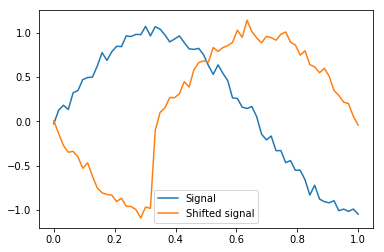

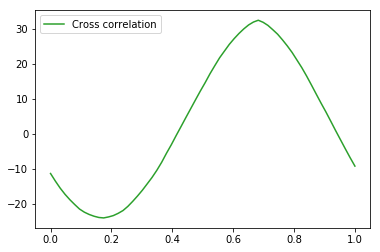

In [76]:
"""
  Lets implement a shift detector for 1D noisy signals
"""
t=np.linspace(0,1,64)
noise=0.05
s1=np.sin(2*np.pi*0.75*t)
delay=len(t)//3
s2=np.roll(s1,delay) #s2[n]=s1[n-2], s2 is delayed
noise1=np.random.normal(0,noise,len(t))
s1 = s1+noise1
noise2=np.random.normal(0,noise,len(t))
s2 = s2+noise2

#Plot signals
fig,ax=plt.subplots()
ax.plot(t,s1,'C0',label="Signal")
ax.plot(t,s2,'C1',label="Shifted signal")
ax.legend()

#now find max correlation
crosscorrelation=np.real(np.fft.ifft(np.fft.fft(s1)*np.fft.fft(s2).conj()))
idx=-((crosscorrelation.argmax()-len(t))%-len(t)) #be careful, % is not defined the same way in c/c++
print("Found delay of ",idx," versus original delay of ",delay)
fig,ax=plt.subplots()
ax.plot(t,crosscorrelation,'C2',label="Cross correlation")
ax.legend()

(-0.5, 1023.5, 767.5, -0.5)

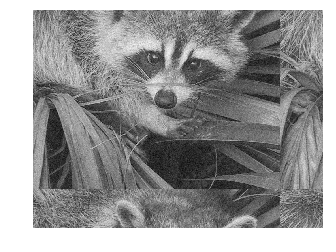

In [77]:
"""
  Let's now do the same for a 2D signal
"""

import scipy
from scipy import misc
xsharp = scipy.misc.face().sum(axis=2) #sum color channel for b/w

#Now, generate 1 shifted + noisy versions
newIm=np.zeros_like(xsharp)
#Generate random translation vector, between -20% and +20% of the original size
maxShift=0.2*np.max(np.array(xsharp.shape))
shift = np.random.randint(-maxShift,maxShift,(2))
    
#Now perform shift
def shiftImage(old,new,shift):
    for x in np.arange(new.shape[0]):
        for y in np.arange(new.shape[1]):
            pos=np.array([x,y])
            oldIdx=pos-shift
            oldIdx=(oldIdx%old.shape).astype(int)
            new[x,y]=old[oldIdx[0],oldIdx[1]]

shiftImage(xsharp,newIm,shift)
#Now add a centered gaussian noise of standard deviation equal to 5% of the input image dynamic
newIm = newIm+np.random.normal(0, scale=newIm.ptp()*0.05,size=newIm.shape)

#Now plot
plt.figure()
plt.imshow(newIm, interpolation='nearest', cmap=plt.cm.gray)
plt.axis("off")

Found shift of  [631 872]  versus original delay of  [-137 -152]


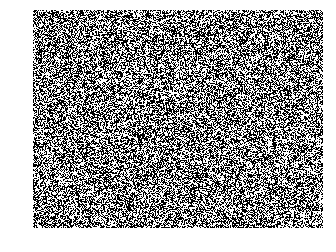

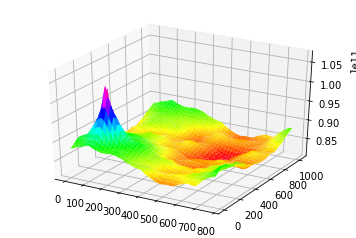

In [78]:
#compute cross correlation with original picture
crosscorrelation=np.real(np.fft.ifft2(np.fft.fft2(xsharp)*np.fft.fft2(newIm).conj()))
shape=np.array(xsharp.shape)
argmax=crosscorrelation.argmax()
argmax=np.unravel_index(argmax,shape)
idx=-((argmax-shape)%-shape) #be careful, % is not defined the same way in c/c++
print("Found shift of ",idx," versus original delay of ",shift)

#Show the image difference:
check=np.zeros_like(xsharp)
#perform inverse shift
shiftImage(newIm,check,-idx)
check=check-xsharp

#Now plot
plt.figure()
plt.imshow(check, interpolation='nearest', cmap=plt.cm.gray)
plt.axis("off")

#Show the crosscorrelation image:
fig = plt.figure()
#zoomcross=crosscorrelation[argmax[0]-15:argmax[0]+15,argmax[1]-15:argmax[1]+15]
zoomcross=crosscorrelation
ogrid = np.lib.index_tricks.nd_grid()
xAxis,yAxis=ogrid[0:zoomcross.shape[0],0:zoomcross.shape[1]]
ax = fig.gca(projection='3d')
ax.plot_surface(xAxis,yAxis,zoomcross,cmap='gist_rainbow')

## Some Fourier transform properties

We must recall some properties of the Fourier transform and its discrete counterpart:

### Shift

We consider the discrete Fourier transform of a signal $s_2[n]=s_1[n-n_0]$ :
The discrete fourier transform reads:
\begin{align*}
  S_2[k]&= \sum_{n=0}^{N-1} s_1[n-n_0]e^{-2 \pi j \frac{kn}{N}} \\
  &= \sum_{n=-n_0}^{N-1-n_0} s_1[n]e^{-2 \pi j \frac{k(n+n_0)}{N}} \\
  &= \sum_{n=-n_0}^{N-1-n_0} s_1[n]e^{-2 \pi j \frac{kn}{N}} e^{-2 \pi j \frac{kn_0}{N}} \\
  S_2[k]&= e^{-2 \pi j \frac{kn_0}{N}} S_1[k]\\
\end{align*}

Such that the DFT of a shifted signal is equal to the DFT of the original signal with a linear phase shift. One can use the cross power spectrum to check for this linear phase shift:

\begin{align*}
  crosspow[k] &=\frac{DFT(s_1)[k] conj(DFT(s_2)[k])}{abs(DFT(s_1)[k]DFT(s_2)[k])} \\
  &= \frac{S_1[k]S_1[k]^{\star} e^{2 \pi j \frac{kn_0}{N}} }{\|S_1[k]S_1[k]\|} \\
  &= e^{2 \pi j \frac{kn_0}{N}}
\end{align*}

And, taking the inverse discrete Fourier transform of this expression, we get:

\begin{align*}
  DFT^{-1}(crosspow)[n] &= \frac{1}{N} \sum_{k=0}^{N-1} e^{2 \pi j \frac{kn_0}{N}} e^{2 \pi j \frac{kn}{N}} \\
  &= \frac{1}{N} \sum_{k=0}^{N-1} e^{2 \pi j \frac{k(n+n0)}{N}}
  &= \begin{cases}
        1 \;&\; \text{if} \quad n \equiv (n_0 \; \text{mod} \; N) \\
        0 & \text{otherwise}
        \end{cases}
\end{align*}

This means that we should be able to find the delay $n_0$ of $s_2$, as $n_0 = N-n_{max} \; \text{mod} \; N$ where $n_{max}$ is the index where the cross power spectrum is maximum.

Found delay of  21  versus original delay of  21


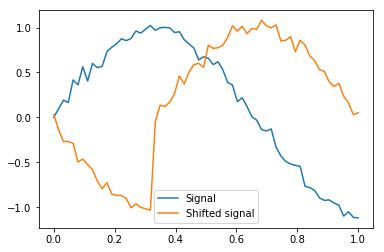

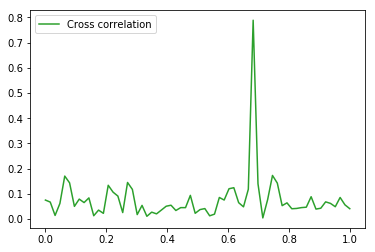

In [79]:
"""
  Lets implement a shift detector for 1D noisy signals using cross power spectrum
"""
t=np.linspace(0,1,64)
noise=0.05
s1=np.sin(2*np.pi*0.75*t)
delay=len(t)//3
s2=np.roll(s1,delay) #s2[n]=s1[n-2], s2 is delayed
noise1=np.random.normal(0,noise,len(t))
s1 = s1+noise1
noise2=np.random.normal(0,noise,len(t))
s2 = s2+noise2

#Plot signals
fig,ax=plt.subplots()
ax.plot(t,s1,'C0',label="Signal")
ax.plot(t,s2,'C1',label="Shifted signal")
ax.legend()

#now find max correlation
crosspowerspectrum=np.abs(np.fft.ifft(np.fft.fft(s1)*np.fft.fft(s2).conj()/(np.abs(np.fft.fft(s1)*np.fft.fft(s2)))))
idx=(len(t)-crosspowerspectrum.argmax())%len(t)
print("Found delay of ",idx," versus original delay of ",delay)
fig,ax=plt.subplots()
ax.plot(t,crosspowerspectrum,'C2',label="Cross correlation")
ax.legend()

### 2-D shift

In 2D, one can show that the same linear shift property applies:

\begin{align*}
  S_2[k,l]&= \sum_{m=0}^{M-1} \sum_{n=0}^{N-1} s_1[m-m_0,n-n_0]e^{-2 \pi j \frac{ln}{N}} e^{-2 \pi j \frac{km}{M}} \\
  &= \sum_{m=0}^{M-1} \sum_{n=-n_0}^{N-1-n_0} s_1[m-m_0,n]e^{-2 \pi j \frac{l(n+n_0)}{N}} e^{-2 \pi j \frac{km}{M}} \\
  &= \sum_{m=-m0}^{M-1-m_0} \sum_{n=-n_0}^{N-1-n_0} s_1[m,n] e^{-2 \pi j \frac{l(n+n0)}{N}} e^{-2 \pi j \frac{k(m+m_0)}{M}} \\
  S_2[k,l] &= e^{-2 \pi j \left( \frac{ln_0}{N}+\frac{km_0}{M} \right)} S_1[k,l]\\
\end{align*}

Here again, it is interesting to use the cross power spectrum to check for this linear phase shift:

\begin{align*}
  crosspow[k,l] &= e^{2 \pi j \left( \frac{ln_0}{N}+\frac{km_0}{M} \right)}
\end{align*}

And, taking the 2D inverse discrete Fourier transform of this expression, we get:

\begin{align*}
  DFT^{-1}(crosspow)[m,n] &= \frac{1}{M} \sum_{k=0}^{M-1} \frac{1}{N} \sum_{l=0}^{N-1} e^{2 \pi j \left( \frac{ln_0}{N}+\frac{km_0}{M} \right)} e^{2 \pi j \frac{ln}{N}} e^{2 \pi j \frac{km}{M}} \\
  &= \frac{1}{M} \sum_{k=0}^{M-1} \frac{1}{N} e^{2 \pi j \left( \frac{l(n+n_0)}{N}+\frac{k(m+m_0)}{M} \right)} \\
  &= \begin{cases}
        1 \;&\; \text{if} \quad n \equiv (n_0 \; \text{mod} \; N) \quad \text{and} \quad m \equiv (m_0 \; \text{mod} \; M) \\
        0 & \text{otherwise}
        \end{cases}
\end{align*}

Here again, one should be able to obtain the shift easily.

Found shift of  [631 872]  versus original delay of  [-137 -152]


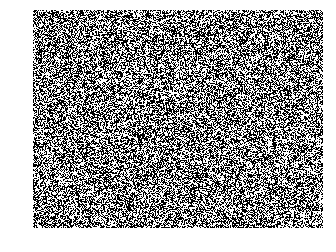

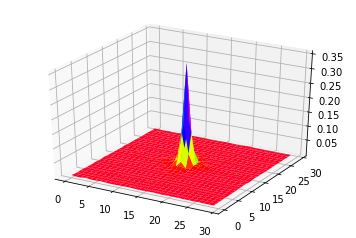

In [80]:
def translation(im0, im1):
    """
      Returns translation vector to register images
    """
    shape = np.array(im0.shape)
    f0 = np.fft.fft2(im0)
    f1 = np.fft.fft2(im1)
    crosspowerspectrum = np.abs(np.fft.ifft2(f0*f1.conj()/np.abs(f0*f1)))
    argmax=np.unravel_index(crosspowerspectrum.argmax(),shape)
    #be careful, % is not defined the same way in c/c++
    return (shape-argmax)%shape

idx=translation(xsharp,newIm)
print("Found shift of ",idx," versus original delay of ",shift)

#Check that registration worked difference:
check=np.zeros_like(xsharp)
#perform inverse shift
shiftImage(newIm,check,-idx)
check=check-xsharp

#Now plot
plt.figure()
plt.imshow(check, interpolation='nearest', cmap=plt.cm.gray)
plt.axis("off")

#Show the crosspowerspectrum image:
fig = plt.figure()
f0 = np.fft.fft2(xsharp)
f1 = np.fft.fft2(newIm)
crosspowerspectrum = np.abs(np.fft.ifft2(f0*f1.conj()/np.abs(f0*f1)))
zoomcross=crosspowerspectrum[argmax[0]-15:argmax[0]+15,argmax[1]-15:argmax[1]+15]
#zoomcross=crosspowerspectrum #too fine grained, cannot see anything
ogrid = np.lib.index_tricks.nd_grid()
xAxis,yAxis=ogrid[0:zoomcross.shape[0],0:zoomcross.shape[1]]
ax = fig.gca(projection='3d')
ax.plot_surface(xAxis,yAxis,zoomcross,cmap='gist_rainbow')

## Fourier transform of rotated and tilted signals

Correlation methods allow to perform rigid tilt registration. However, what happen if there is a composition between a change of variable and a tilt ?

Lets define $s_2$ as a tilted and rotated version of $s_1$:

\begin{align*}
  s_2 \begin{pmatrix} x \\ y \end{pmatrix} = s_1\left( M \begin{pmatrix} x \\ y \end{pmatrix} -
  \begin{pmatrix} x_0 \\ y_0 \end{pmatrix} \right)
\end{align*}

Where M is a rotation matrix of the form

\begin{align*}
  M = \begin{pmatrix}
  cos(\theta_0) & sin(\theta_0) \\
  -sin(\theta_0) & cos(\theta_0) \end{pmatrix}
\end{align*}

Where M is a unitary matrix, so that its determinant is 1, and its inverse is equal to its transpose

### Bidimensional Fourier transform, and change of variable

We have the following definition:


\begin{align*}
  S_2\begin{pmatrix} f_x \\ f_y \end{pmatrix}
    &= \int_{\mathbb{R}}\int_{\mathbb{R}}
      s_2(x,y) e^{-2 \pi j \begin{pmatrix} f_x \\ f_y \end{pmatrix}^{\intercal}
      \begin{pmatrix} x \\ y \end{pmatrix}} dxdy \\
    &= \int_{\mathbb{R}}\int_{\mathbb{R}} s_1\left( M \left( \begin{pmatrix} x \\ y \end{pmatrix} -
      \begin{pmatrix} x_0 \\ y_0 \end{pmatrix} \right) \right)
      e^{-2 \pi j \begin{pmatrix} f_x \\ f_y \end{pmatrix}^{\intercal} \begin{pmatrix} x \\ y \end{pmatrix}} dx dy \\
    &= \int_{\mathbb{R}}\int_{\mathbb{R}} s_1 \begin{pmatrix} t \\ u \end{pmatrix}
      e^{-2 \pi j \begin{pmatrix} f_x \\ f_y \end{pmatrix}^{\intercal}
        \left( M^{-1} \begin{pmatrix} t \\ u \end{pmatrix} + \begin{pmatrix} x_0 \\ y_0 \end{pmatrix} \right)}
      \frac{1}{|det(M)|} dt du \\
\end{align*}

As $M$ is a unitary matrix, we have $|det(M)|=1$ and it can be shown that we obtain:

\begin{align*}
  S_2\begin{pmatrix} f_x \\ f_y \end{pmatrix} =
    e^{-2 \pi j \begin{pmatrix} f_x \\ f_y \end{pmatrix}^{\intercal}
      \begin{pmatrix} x_0 \\ y_0 \end{pmatrix}}
    S_1\left( M^{-1} \begin{pmatrix} f_x \\ f_y \end{pmatrix} \right)
\end{align*}

We see that spectrum of $s_2$ is equivalent to the spectrum of $s_1$, but with a rotation, in addition to the linear phase shift we have already seen previously.

### Fourier transform in polar coordinates

Lets now analyze what happens in 2D polar coordinates: $\begin{pmatrix} \theta, r \end{pmatrix}$.
We recall that the function $C$ that allows for the change of variables reads:

\begin{align*}
  C \begin{pmatrix} \theta \\ r \end{pmatrix} =
  \begin{pmatrix} r \;cos(\theta)\\ r \;sin(\theta)\end{pmatrix}
\end{align*}

and $C^{-1}$ its inverse. We also define $ \begin{pmatrix} f_x \\ f_y \end{pmatrix} = C \begin{pmatrix} f_{\theta} \\ f_r \end{pmatrix}$
We have:
\begin{align*}
  S_2 \left( C \begin{pmatrix} f_{\theta} \\ f_r \end{pmatrix} \right)
    &= e^{-2 \pi j C \left( \begin{pmatrix} f_\theta \\ f_r \end{pmatrix} \right)^{\intercal}
        \begin{pmatrix} x_0 \\ y_0 \end{pmatrix}}
      S_1\left( M^{-1} C \begin{pmatrix} f_\theta \\ f_r \end{pmatrix} \right) \\
    &= e^{-2 \pi j C \left( \begin{pmatrix} f_\theta \\ f_r \end{pmatrix} \right)^{\intercal}
        \begin{pmatrix} x_0 \\ y_0 \end{pmatrix}}
       S_1\left(C\begin{pmatrix} f_{\theta}-\theta_0 \\ f_r \end{pmatrix}\right)
\end{align*}
If we now define the expression of $S_1$ and $S_2$ in polar coordinates respectively as $S_{1pol}$ and $S_{2pol}$, we can write:
\begin{align*}
  S_{2pol}\begin{pmatrix} f_{\theta} \\ f_r \end{pmatrix}
    &= e^{-2 \pi j C \left( \begin{pmatrix} f_\theta \\ f_r \end{pmatrix} \right)^{\intercal}
        \begin{pmatrix} x_0 \\ y_0 \end{pmatrix}}
       S_{1pol} \begin{pmatrix} f_{\theta}-\theta_0 \\ f_r \end{pmatrix} \\
\end{align*}

We can see that, when the Fourier transform is expressed in polar coordinate, the spectrum of $s_2$ is now equivalent to the spectrum of $s_1$ shifted along the $\theta$ direction, with a variable phase shift.

If we consider only the magnitude of the spectrum of $s_1$ and $s_2$ in polar coordinates, we see that those should be the same, but shifted by the angle $\theta_0$. As we now how to compute the shift between two datasets, it should be easy to determine $\theta_0$.

(-0.5, 1023.5, 767.5, -0.5)

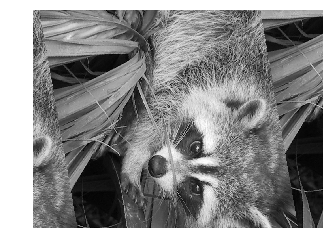

In [88]:
def GetRotMat(theta):
  return np.array([[np.cos(theta),-np.sin(theta)],[np.sin(theta),np.cos(theta)]])

shape=np.array(xsharp.shape)
newIm=np.zeros_like(xsharp)
#Generate random rotation matrix between -90 and +90 degrees
theta = np.random.uniform(-90,90)*((2*np.pi)/360)
Mrot = GetRotMat(theta)
Mroti = Mrot.T
#Generate random translation vector, between -5% and +5% of the original size
maxShift=0.05*np.max(shape)
shift = np.random.uniform(-maxShift,maxShift,(2))

#Now perform rotation/shift
center=np.array(shape)/2
for x in np.arange(newIm.shape[0]):
  for y in np.arange(newIm.shape[1]):
    pos=np.array([x,y])
    oldIdx=np.dot(Mroti,(pos-center))+shift+center
    oldIdx=(oldIdx%shape).astype(int)
    newIm[x,y]=xsharp[oldIdx[0],oldIdx[1]]
    
#Now plot
plt.figure()
plt.imshow(newIm, interpolation='nearest', cmap=plt.cm.gray)
plt.axis("off")

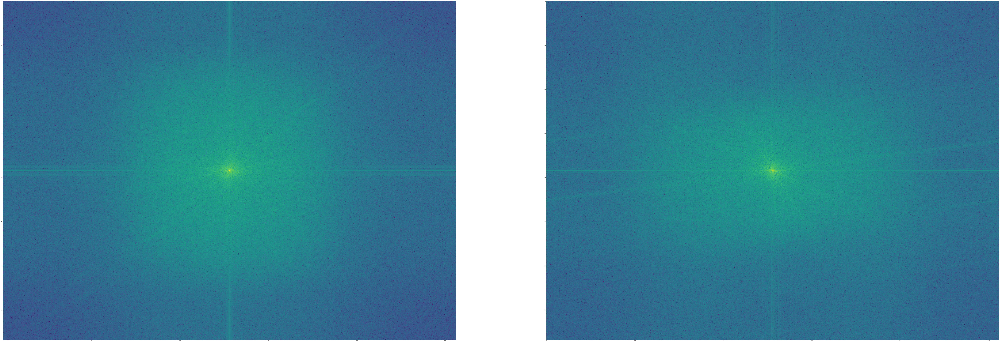

In [89]:
"""
  It must be noticed that we are using a highpass filter for polar fft
  because the frequency resolution is very bad for low r coordinates
"""  

import scipy.ndimage.interpolation as ndii
from matplotlib import colors

def polar(image, anglesRatio=1, radiiRatio=1):
    """Return polar transformed image"""
    shape = np.array(image.shape)
    center = shape/2
    angles = shape[0]
    radii = shape[1]
    angles = np.int(angles*anglesRatio)
    radii = np.int(radii*radiiRatio) 
    theta = np.zeros((angles, radii))
    #Fill column vector from theta with linspace
    theta.T[:] = np.linspace(0, np.pi*anglesRatio, angles, endpoint=False)
    maxCoord = shape-center
    d = np.linalg.norm(maxCoord)
    radius = np.zeros_like(theta)
    #Fill row vector from radius with radii
    radius[:] = np.linspace(d*(1-radiiRatio),d,radii)
    x = radius * np.cos(theta) + center[0]
    y = radius * np.sin(theta) + center[1]
    output = np.zeros_like(x)
    ndii.map_coordinates(image, [x, y], output=output)
    return output

xsharp = scipy.misc.face().sum(axis=2) #sum color channel for b/w
fft0=np.absolute(np.fft.fftshift(np.fft.fft2(xsharp)))
norm0=colors.LogNorm(fft0.min(), fft0.max(), clip='True')
fft1=np.absolute(np.fft.fftshift(np.fft.fft2(newIm)))
norm1=colors.LogNorm(fft1.min(), fft1.max(), clip='True')

fig,ax = plt.subplots(1,2,figsize=(200,100))
ax[0].imshow(fft0,norm=norm0)
ax[1].imshow(fft1,norm=norm1)

#polar fourier transform
fft0=polar(fft0,radiiRatio=0.8)
fft1=polar(fft1,radiiRatio=0.8)

fig,ax = plt.subplots(1,2,figsize=(200,100))
ax[0].imshow(fft0,norm=norm0)
ax[1].imshow(fft1,norm=norm1)

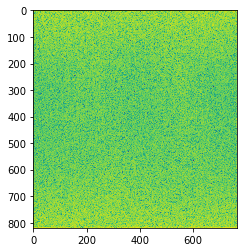

In [83]:
"""
  Now estimate the angle.
"""

#idx=translation(fft0,fft1)
#print("Found shift of ",(idx[1]/shape[1])*180," versus original angle of ",theta*180/np.pi)

#Show the crosspowerspectrum image:
f0 = np.fft.fft(fft0.T,axis=0)
f1 = np.fft.fft(fft1.T,axis=0)
cross=np.abs(np.fft.ifft(f0*f1.conj()/np.abs(f0*f1),axis=0))
#cross=cross.sum(axis=1)

#f0 = np.fft.fftshift(np.fft.fft(fft0,axis=1).T)
#f1 = np.fft.fftshift(np.fft.fft(fft1,axis=1).T)

#Now plot
plt.figure()
crossnorm=colors.LogNorm(cross.min(), cross.max())
plt.imshow(cross, norm=crossnorm)
#f0=np.abs(f0)+1
#print("status is ",(f0>=0).all())
#f0[(np.isreal(f0)-1)*-1]=0
#norm0=colors.LogNorm(f0.min(), f0.max())
#plt.imshow(f0, norm=norm0)

#crosspowerspectrum = np.abs(np.fft.ifft(f0*f1.conj()/np.abs(f0*f1),axis=0))
#zoomcross=crosspowerspectrum
#zoomcross=crosspowerspectrum #too fine grained, cannot see anything
#ogrid = np.lib.index_tricks.nd_grid()
#xAxis,yAxis=ogrid[0:zoomcross.shape[0],0:zoomcross.shape[1]]
#ax = fig.gca(projection='3d')
#ax.plot_surface(xAxis,yAxis,zoomcross,cmap='gist_rainbow')

#Now plot
#plt.figure()
#plt.imshow(check, interpolation='nearest', cmap=plt.cm.gray)
#plt.axis("off")

### Scaling anf logarithmic scale

Considering the case of periodic signals, that are scaled: $s_{\alpha}(\cdot)=s(\alpha \cdot)$ and their respective Fourier transform $S_{\alpha}$ and $S$, we can write
\begin{align*}
  S_{\alpha}(f) &= \int_{\mathbb{R}} s(\alpha t) e^{-2\pi j f t} dt \\
  &= \frac{1}{\alpha} \int_{\mathbb{R}} s(u) e^{-2\pi j f \frac{u}{\alpha}} du \quad \text{with $u=\alpha t$} \\
  S_{\alpha}(f) &= \frac{1}{\alpha} S\left(\frac{f}{\alpha}\right)
\end{align*}

Now let say that we want to represent the frequency axis with a logarithmic scale, we have:
\begin{align*}
  S_{\alpha}(ln(f)) &= \frac{1}{\alpha} S\left(ln \left( \frac{f}{\alpha}\right) \right)\\
  &= \frac{1}{\alpha} S\left(ln(f)-ln(\alpha) \right)
\end{align*}


And in 2D, we have:

\begin{align*}
  S_{\alpha, \beta}(ln(f_x), ln(f_y)) &= \frac{1}{\alpha\beta} S\left(ln \left( \frac{f_x}{\alpha}\right), ln \left( \frac{f_y}{\alpha}\right) \right)\\
  &= \frac{1}{\alpha\beta} S\left(ln(f_x)-ln(\alpha), ln(f_y)-ln(\beta) \right)
\end{align*}

Here as well, for real signal, if we take either real/imaginary of module part of the spectrum, we should be able to solve the simple shift detection problem. with technics seen previously.

(-0.5, 1023.5, 767.5, -0.5)

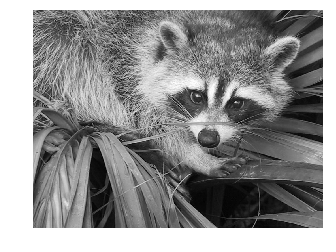

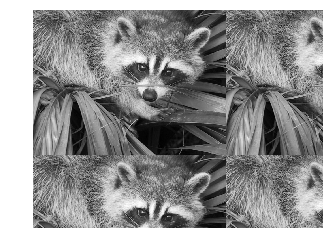

In [84]:
"""
  Lets implement a scaling detector for 2D images using cross power spectrum of log-scaled spectra
"""
#Image is xsharp, now generate a subsampled version:
ratio=0.666
shape=np.array(xsharp.shape)
newShape=(ratio*shape).astype(np.int)
subsampled=scipy.misc.imresize(xsharp, newShape, interp='bilinear')
#regenerate an image with the same size as the larger one, with mirror boundary conditions
subsampled=np.tile(subsampled,(shape+newShape-1)//newShape)[0:shape[0],0:shape[1]]

#Now plot
plt.figure()
plt.imshow(xsharp, interpolation='nearest', cmap=plt.cm.gray)
plt.axis("off")
plt.figure()
plt.imshow(subsampled, interpolation='nearest', cmap=plt.cm.gray)
plt.axis("off")



In [80]:
"""FFT based image registration.
Implements an FFT-based technique for translation, rotation and scale-invariant
image registration [1].
(1) An FFT-based technique for translation, rotation and scale-invariant
    image registration. BS Reddy, BN Chatterji.
    IEEE Transactions on Image Processing, 5, 1266-1271, 1996
(2) An IDL/ENVI implementation of the FFT-based algorithm for automatic
    image registration. H Xiea, N Hicksa, GR Kellera, H Huangb, V Kreinovich.
    Computers & Geosciences, 29, 1045-1055, 2003.
(3) Image Registration Using Adaptive Polar Transform. R Matungka, YF Zheng,
    RL Ewing. IEEE Transactions on Image Processing, 18(10), 2009.
"""

try:
    import scipy.ndimage.interpolation as ndii
except ImportError:
    import ndimage.interpolation as ndii




def similarity(im0, im1):
    """Return similarity transformed image im1 and transformation parameters.

    Transformation parameters are: isotropic scale factor, rotation angle (in
    degrees), and translation vector.

    A similarity transformation is an affine transformation with isotropic
    scale and without shear.

    Limitations:
    Image shapes must be equal and square.
    All image areas must have same scale, rotation, and shift.
    Scale change must be less than 1.8.
    No subpixel precision.

    """
    if im0.shape != im1.shape:
        raise ValueError("Images must have same shapes.")
    elif len(im0.shape) != 2:
        raise ValueError("Images must be 2 dimensional.")

    f0 = fftshift(abs(fft2(im0)))
    f1 = fftshift(abs(fft2(im1)))

    h = highpass(f0.shape)
    f0 *= h
    f1 *= h
    del h

    f0, log_base = logpolar(f0)
    f1, log_base = logpolar(f1)

    f0 = fft2(f0)
    f1 = fft2(f1)
    r0 = abs(f0) * abs(f1)
    ir = abs(ifft2((f0 * f1.conjugate()) / r0))
    i0, i1 = numpy.unravel_index(numpy.argmax(ir), ir.shape)
    angle = 180.0 * i0 / ir.shape[0]
    scale = log_base ** i1

    if scale > 1.8:
        ir = abs(ifft2((f1 * f0.conjugate()) / r0))
        i0, i1 = numpy.unravel_index(numpy.argmax(ir), ir.shape)
        angle = -180.0 * i0 / ir.shape[0]
        scale = 1.0 / (log_base ** i1)
        if scale > 1.8:
            raise ValueError("Images are not compatible. Scale change > 1.8")

    if angle < -90.0:
        angle += 180.0
    elif angle > 90.0:
        angle -= 180.0

    im2 = ndii.zoom(im1, 1.0/scale)
    im2 = ndii.rotate(im2, angle)

    if im2.shape < im0.shape:
        t = numpy.zeros_like(im0)
        t[:im2.shape[0], :im2.shape[1]] = im2
        im2 = t
    elif im2.shape > im0.shape:
        im2 = im2[:im0.shape[0], :im0.shape[1]]

    f0 = fft2(im0)
    f1 = fft2(im2)
    ir = abs(ifft2((f0 * f1.conjugate()) / (abs(f0) * abs(f1))))
    t0, t1 = numpy.unravel_index(numpy.argmax(ir), ir.shape)

    if t0 > f0.shape[0] // 2:
        t0 -= f0.shape[0]
    if t1 > f0.shape[1] // 2:
        t1 -= f0.shape[1]

    im2 = ndii.shift(im2, [t0, t1])

    # correct parameters for ndimage's internal processing
    if angle > 0.0:
        d = int((int(im1.shape[1] / scale) * math.sin(math.radians(angle))))
        t0, t1 = t1, d+t0
    elif angle < 0.0:
        d = int((int(im1.shape[0] / scale) * math.sin(math.radians(angle))))
        t0, t1 = d+t1, d+t0
    scale = (im1.shape[1] - 1) / (int(im1.shape[1] / scale) - 1)

    return im2, scale, angle, [-t0, -t1]


def similarity_matrix(scale, angle, vector):
    """Return homogeneous transformation matrix from similarity parameters.

    Transformation parameters are: isotropic scale factor, rotation angle (in
    degrees), and translation vector (of size 2).

    The order of transformations is: scale, rotate, translate.

    """
    S = numpy.diag([scale, scale, 1.0])
    R = numpy.identity(3)
    angle = math.radians(angle)
    R[0, 0] = math.cos(angle)
    R[1, 1] = math.cos(angle)
    R[0, 1] = -math.sin(angle)
    R[1, 0] = math.sin(angle)
    T = numpy.identity(3)
    T[:2, 2] = vector
    return numpy.dot(T, numpy.dot(R, S))


def logpolar(image, angles=None, radii=None):
    """Return log-polar transformed image and log base."""
    shape = image.shape
    center = shape[0] / 2, shape[1] / 2
    if angles is None:
        angles = shape[0]
    if radii is None:
        radii = shape[1]
    theta = numpy.empty((angles, radii), dtype=numpy.float64)
    theta.T[:] = -numpy.linspace(0, numpy.pi, angles, endpoint=False)
    #d = radii
    d = numpy.hypot(shape[0]-center[0], shape[1]-center[1])
    log_base = 10.0 ** (math.log10(d) / (radii))
    radius = numpy.empty_like(theta)
    radius[:] = numpy.power(log_base, numpy.arange(radii,
                                                   dtype=numpy.float64)) - 1.0
    x = radius * numpy.sin(theta) + center[0]
    y = radius * numpy.cos(theta) + center[1]
    output = numpy.empty_like(x)
    ndii.map_coordinates(image, [x, y], output=output)
    return output, log_base


def highpass(shape):
    """Return highpass filter to be multiplied with fourier transform."""
    x = numpy.outer(
        numpy.cos(numpy.linspace(-math.pi/2., math.pi/2., shape[0])),
        numpy.cos(numpy.linspace(-math.pi/2., math.pi/2., shape[1])))
    return (1.0 - x) * (2.0 - x)


